In [49]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import datetime
import networkx as nx

In [3]:
bike = pd.read_csv("./data/bike2.csv")

C:\Users\asd\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3020: DtypeWarning: Columns (0,1) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [4]:
bike.shape

(3250546, 12)

In [5]:
bike.head()

,대여소번호,반납대여소번호,공유횟수,자전거번호,대여일시,대여대여소명,대여거치대,반납일시,반납대여소명,반납거치대,이용시간,이용거리
0,101,104,343,SPB-14657,2018-07-04 8:50,(구)합정동 주민센터,2.0,2018-07-04 8:55,합정역 1번출구 앞,8.0,4.0,1010.0
1,101,104,343,SPB-15070,2018-07-04 11:42,(구)합정동 주민센터,5.0,2018-07-04 11:51,합정역 1번출구 앞,11.0,9.0,1360.0
2,101,104,343,SPB-17206,2018-07-04 12:33,(구)합정동 주민센터,2.0,2018-07-04 12:50,합정역 1번출구 앞,3.0,16.0,1110.0
3,101,104,343,SPB-13389,2018-07-04 20:04,(구)합정동 주민센터,2.0,2018-07-04 20:12,합정역 1번출구 앞,9.0,7.0,1190.0
4,101,104,343,SPB-13038,2018-07-06 7:14,(구)합정동 주민센터,1.0,2018-07-06 7:20,합정역 1번출구 앞,12.0,5.0,840.0


In [6]:
bike = bike.drop(['대여거치대', '반납거치대'], axis=1) # 거치대 정보 제거

In [7]:
bike.dtypes

대여소번호       object
반납대여소번호     object
공유횟수         int64
자전거번호       object
대여일시        object
대여대여소명      object
반납일시        object
반납대여소명      object
이용시간       float64
이용거리       float64
dtype: object

In [8]:
bike['대여일시'] = pd.to_datetime(bike['대여일시'])

In [9]:
bike['반납일시'] = pd.to_datetime(bike['반납일시'])

In [10]:
bike['대여시간'] = bike['대여일시'].dt.hour

In [11]:
bike['반납시간'] = bike['반납일시'].dt.hour

In [12]:
bike.head()

,대여소번호,반납대여소번호,공유횟수,자전거번호,대여일시,대여대여소명,반납일시,반납대여소명,이용시간,이용거리,대여시간,반납시간
0,101,104,343,SPB-14657,2018-07-04 08:50:00,(구)합정동 주민센터,2018-07-04 08:55:00,합정역 1번출구 앞,4.0,1010.0,8,8
1,101,104,343,SPB-15070,2018-07-04 11:42:00,(구)합정동 주민센터,2018-07-04 11:51:00,합정역 1번출구 앞,9.0,1360.0,11,11
2,101,104,343,SPB-17206,2018-07-04 12:33:00,(구)합정동 주민센터,2018-07-04 12:50:00,합정역 1번출구 앞,16.0,1110.0,12,12
3,101,104,343,SPB-13389,2018-07-04 20:04:00,(구)합정동 주민센터,2018-07-04 20:12:00,합정역 1번출구 앞,7.0,1190.0,20,20
4,101,104,343,SPB-13038,2018-07-06 07:14:00,(구)합정동 주민센터,2018-07-06 07:20:00,합정역 1번출구 앞,5.0,840.0,7,7


### 출퇴근 시간에 급증한다
### 오후~저녁에 오전보다 많은 사용량을 보인다 (당연할 수도 있지만)

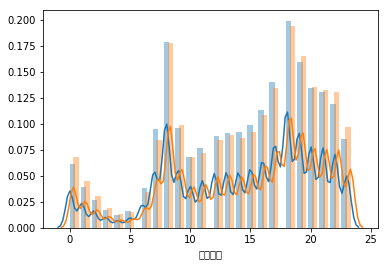

In [13]:
sns.distplot(bike['대여시간'])
sns.distplot(bike['반납시간']+0.3)

In [14]:
bike['주말'] = pd.DataFrame(bike['대여일시'].dt.weekday >= 5)
bike.head()

,대여소번호,반납대여소번호,공유횟수,자전거번호,대여일시,대여대여소명,반납일시,반납대여소명,이용시간,이용거리,대여시간,반납시간,주말
0,101,104,343,SPB-14657,2018-07-04 08:50:00,(구)합정동 주민센터,2018-07-04 08:55:00,합정역 1번출구 앞,4.0,1010.0,8,8,False
1,101,104,343,SPB-15070,2018-07-04 11:42:00,(구)합정동 주민센터,2018-07-04 11:51:00,합정역 1번출구 앞,9.0,1360.0,11,11,False
2,101,104,343,SPB-17206,2018-07-04 12:33:00,(구)합정동 주민센터,2018-07-04 12:50:00,합정역 1번출구 앞,16.0,1110.0,12,12,False
3,101,104,343,SPB-13389,2018-07-04 20:04:00,(구)합정동 주민센터,2018-07-04 20:12:00,합정역 1번출구 앞,7.0,1190.0,20,20,False
4,101,104,343,SPB-13038,2018-07-06 07:14:00,(구)합정동 주민센터,2018-07-06 07:20:00,합정역 1번출구 앞,5.0,840.0,7,7,False


### 주말은 오후~저녁 시간대에 많이 탄다

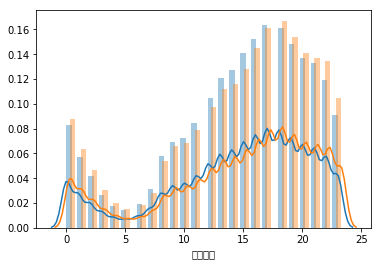

In [15]:
sns.distplot(bike[bike['주말'] == True]['대여시간'])
sns.distplot(bike[bike['주말'] == True]['반납시간']+0.3)

### 주중은 출퇴근 시간에 급증한다

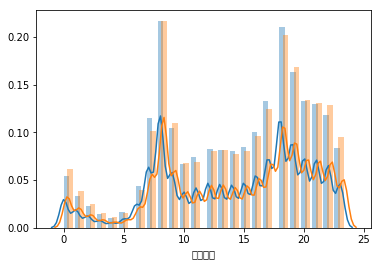

In [16]:
sns.distplot(bike[bike['주말'] == 0]['대여시간'])
sns.distplot(bike[bike['주말'] == 0]['반납시간']+0.3)

### 주중이 주말보다 이용률 약 3배 높다. 
#### 산술계산으로는 2.5배 많아야 하는데, 이는 정기적으로 출퇴근에 이용하는 인구가 많다는 것을 보이는 듯

In [17]:
weekdays_tf = bike['주말'].value_counts()

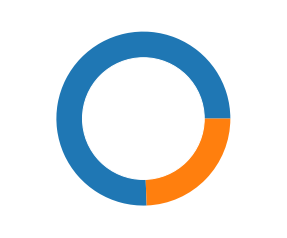

In [18]:
my_circle = plt.Circle( (0,0), 0.7, color='white')
plt.pie([weekdays_tf[0], weekdays_tf[1]], labels=['weekday', 'weekend'], textprops={'color': 'w', 'fontsize':15})
p=plt.gcf()
p.gca().add_artist(my_circle)

### 출퇴근 시간에 급증한다
### 오후~저녁에 오전보다 많은 사용량을 보인다 (당연할 수도 있지만)

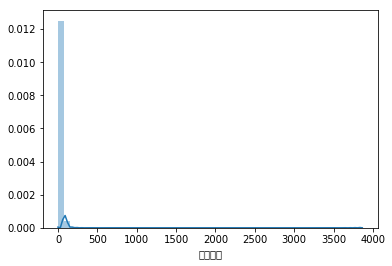

In [19]:
sns.distplot(bike['이용시간'])

In [20]:
bike['이용시간'].quantile([0.01*x for x in range(101)])

0.00       0.0
0.01       2.0
0.02       2.0
0.03       2.0
0.04       2.0
0.05       3.0
0.06       3.0
0.07       3.0
0.08       3.0
0.09       3.0
0.10       3.0
0.11       3.0
0.12       3.0
0.13       4.0
0.14       4.0
0.15       4.0
0.16       4.0
0.17       4.0
0.18       4.0
0.19       4.0
0.20       4.0
0.21       4.0
0.22       4.0
0.23       5.0
0.24       5.0
0.25       5.0
0.26       5.0
0.27       5.0
0.28       5.0
0.29       5.0
         ...  
0.71      13.0
0.72      13.0
0.73      14.0
0.74      14.0
0.75      15.0
0.76      15.0
0.77      16.0
0.78      17.0
0.79      17.0
0.80      18.0
0.81      19.0
0.82      21.0
0.83      22.0
0.84      24.0
0.85      26.0
0.86      28.0
0.87      31.0
0.88      34.0
0.89      37.0
0.90      41.0
0.91      44.0
0.92      48.0
0.93      51.0
0.94      55.0
0.95      59.0
0.96      69.0
0.97      82.0
0.98      97.0
0.99     113.0
1.00    3864.0
Name: 이용시간, Length: 101, dtype: float64

### 따릉이는 2시간권이 최대이기 때문에 120분 이상 쓰면 요금이 부과되고, 99%는 113분 내로 이용한다
#### 적정 시간을 추가하더라도 200분 이상 쓴 것은 제거하는 것이 맞다

In [21]:
biking = bike[bike['이용시간'] < 200]

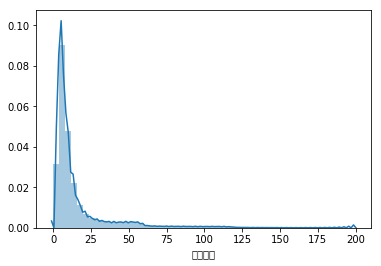

In [22]:
sns.distplot(biking['이용시간'])

### 주말에 조금이나마 이용시간이 길다

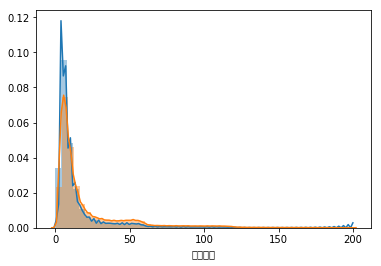

In [23]:
sns.distplot(biking[biking['주말'] == False]['이용시간'])
sns.distplot(biking[biking['주말'] == True]['이용시간']+0.3)

In [75]:
commute = biking.loc[(biking['주말']==False) & ((biking['대여시간']==8) | (biking['대여시간']==18))].copy()

In [89]:
commute_up = commute.loc[biking['대여시간']==8].copy()
commute_up.head()

,대여소번호,반납대여소번호,공유횟수,자전거번호,대여일시,대여대여소명,반납일시,반납대여소명,이용시간,이용거리,대여시간,반납시간,주말
0,101,104,343,SPB-14657,2018-07-04 08:50:00,(구)합정동 주민센터,2018-07-04 08:55:00,합정역 1번출구 앞,4.0,1010.0,8,8,False
16,101,104,343,SPB-16907,2018-07-11 08:41:00,(구)합정동 주민센터,2018-07-11 08:46:00,합정역 1번출구 앞,5.0,1010.0,8,8,False
37,101,104,343,SPB-09949,2018-07-24 08:37:00,(구)합정동 주민센터,2018-07-24 08:44:00,합정역 1번출구 앞,6.0,1050.0,8,8,False
40,101,104,343,SPB-11486,2018-07-25 08:00:00,(구)합정동 주민센터,2018-07-25 08:08:00,합정역 1번출구 앞,7.0,970.0,8,8,False
42,101,104,343,SPB-08990,2018-07-26 08:05:00,(구)합정동 주민센터,2018-07-26 08:10:00,합정역 1번출구 앞,5.0,750.0,8,8,False


In [90]:
commute_down = commute.loc[biking['대여시간']==18].copy()
commute_down.head()

,대여소번호,반납대여소번호,공유횟수,자전거번호,대여일시,대여대여소명,반납일시,반납대여소명,이용시간,이용거리,대여시간,반납시간,주말
48,101,104,343,SPB-08492,2018-07-27 18:28:00,(구)합정동 주민센터,2018-07-27 18:36:00,합정역 1번출구 앞,7.0,1060.0,18,18,False
53,101,104,343,SPB-14726,2018-07-31 18:00:00,(구)합정동 주민센터,2018-07-31 18:06:00,합정역 1번출구 앞,4.0,1010.0,18,18,False
56,101,104,343,SPB-11862,2018-08-01 18:01:00,(구)합정동 주민센터,2018-08-01 18:09:00,합정역 1번출구 앞,7.0,1010.0,18,18,False
79,101,104,343,SPB-09349,2018-08-08 18:00:00,(구)합정동 주민센터,2018-08-08 18:06:00,합정역 1번출구 앞,5.0,870.0,18,18,False
154,101,104,343,SPB-05765,2018-08-31 18:01:00,(구)합정동 주민센터,2018-08-31 18:09:00,합정역 1번출구 앞,7.0,1060.0,18,18,False


In [190]:
weekend_leisure = biking.loc[(biking['주말']==True)].copy()
weekend_leisure.head()

,대여소번호,반납대여소번호,공유횟수,자전거번호,대여일시,대여대여소명,반납일시,반납대여소명,이용시간,이용거리,대여시간,반납시간,주말
6,101,104,343,SPB-07318,2018-07-07 08:41:00,(구)합정동 주민센터,2018-07-07 08:53:00,합정역 1번출구 앞,11.0,1260.0,8,8,True
7,101,104,343,SPB-05216,2018-07-07 08:41:00,(구)합정동 주민센터,2018-07-07 08:53:00,합정역 1번출구 앞,11.0,1330.0,8,8,True
8,101,104,343,SPB-09528,2018-07-07 08:55:00,(구)합정동 주민센터,2018-07-07 09:02:00,합정역 1번출구 앞,6.0,950.0,8,9,True
9,101,104,343,SPB-10669,2018-07-07 15:40:00,(구)합정동 주민센터,2018-07-07 15:48:00,합정역 1번출구 앞,7.0,1010.0,15,15,True
10,101,104,343,SPB-08468,2018-07-07 19:46:00,(구)합정동 주민센터,2018-07-07 19:54:00,합정역 1번출구 앞,7.0,850.0,19,19,True


## 자전거를 이용한 지역 group 이동을 알아보자

In [24]:
place_group = pd.read_csv("./data/place_group.csv")
place_group.head()

,구명,대여소번호,대여소 주소,groups,위도,경도
0,강남구,2301,서울특별시 강남구 압구정로 134현대고등학교 건너편,5,37.524071,127.021790
1,강남구,2302,서울특별시 강남구 봉은사로 지하 102교보타워 버스정류장,45,37.505581,127.024277
2,강남구,2303,서울특별시 강남구 학동로 지하 102논현역 7번출구,54,37.511517,127.021477
3,강남구,2304,서울특별시 강남구 언주로 626신영 ROYAL PALACE앞,95,37.512527,127.035835
4,강남구,2305,서울특별시 강남구 언주로 734MCM 본사 직영점 앞,194,37.520641,127.034508


In [25]:
bike_group = pd.merge(biking, place_group[['대여소번호', 'groups']].rename(columns = {'groups':'대여소그룹'}), 
                      how='inner', on='대여소번호')

In [26]:
bike_group = pd.merge(bike_group, place_group[['대여소번호', 'groups']].rename(columns = {'groups':'반납소그룹'}), 
                      how='inner', left_on='반납대여소번호', right_on='대여소번호')

In [27]:
bike_group.head()

,대여소번호_x,반납대여소번호,공유횟수,자전거번호,대여일시,대여대여소명,반납일시,반납대여소명,이용시간,이용거리,대여시간,반납시간,주말,대여소그룹,대여소번호_y,반납소그룹
0,101,104,343,SPB-14657,2018-07-04 08:50:00,(구)합정동 주민센터,2018-07-04 08:55:00,합정역 1번출구 앞,4.0,1010.0,8,8,False,238,104,392
1,101,104,343,SPB-15070,2018-07-04 11:42:00,(구)합정동 주민센터,2018-07-04 11:51:00,합정역 1번출구 앞,9.0,1360.0,11,11,False,238,104,392
2,101,104,343,SPB-17206,2018-07-04 12:33:00,(구)합정동 주민센터,2018-07-04 12:50:00,합정역 1번출구 앞,16.0,1110.0,12,12,False,238,104,392
3,101,104,343,SPB-13389,2018-07-04 20:04:00,(구)합정동 주민센터,2018-07-04 20:12:00,합정역 1번출구 앞,7.0,1190.0,20,20,False,238,104,392
4,101,104,343,SPB-13038,2018-07-06 07:14:00,(구)합정동 주민센터,2018-07-06 07:20:00,합정역 1번출구 앞,5.0,840.0,7,7,False,238,104,392


In [28]:
bike_group = bike_group.drop(['자전거번호', '대여소번호_y'], axis=1).rename(columns = {'대여소번호_x':'대여소번호'})
bike_group.head()

,대여소번호,반납대여소번호,공유횟수,대여일시,대여대여소명,반납일시,반납대여소명,이용시간,이용거리,대여시간,반납시간,주말,대여소그룹,반납소그룹
0,101,104,343,2018-07-04 08:50:00,(구)합정동 주민센터,2018-07-04 08:55:00,합정역 1번출구 앞,4.0,1010.0,8,8,False,238,392
1,101,104,343,2018-07-04 11:42:00,(구)합정동 주민센터,2018-07-04 11:51:00,합정역 1번출구 앞,9.0,1360.0,11,11,False,238,392
2,101,104,343,2018-07-04 12:33:00,(구)합정동 주민센터,2018-07-04 12:50:00,합정역 1번출구 앞,16.0,1110.0,12,12,False,238,392
3,101,104,343,2018-07-04 20:04:00,(구)합정동 주민센터,2018-07-04 20:12:00,합정역 1번출구 앞,7.0,1190.0,20,20,False,238,392
4,101,104,343,2018-07-06 07:14:00,(구)합정동 주민센터,2018-07-06 07:20:00,합정역 1번출구 앞,5.0,840.0,7,7,False,238,392


In [29]:
bike_group['대여소그룹'].value_counts() # 317개 그룹

116    15050
11     14543
38     12867
346    11720
9      11334
356    10172
253     9929
310     8959
77      8694
114     8488
178     8070
251     7930
6       7847
153     7596
16      7373
286     7366
271     7204
185     7100
93      6933
377     6846
191     6484
121     6368
204     6341
100     6229
125     6072
259     6032
102     5913
400     5665
31      5656
79      5648
       ...  
272      350
211      349
283      347
171      342
226      341
21       341
244      335
493      330
236      329
15       328
256      328
418      327
384      327
482      322
218      321
71       321
345      321
75       318
375      317
176      314
246      313
3        309
240      309
314      308
167      308
460      305
411      304
428      304
336      303
243      301
Name: 대여소그룹, Length: 317, dtype: int64

In [30]:
bike_group['반납소그룹'].value_counts() # 308개 그룹

116    19022
38     12656
346    11238
377    10352
9      10343
310    10026
11      9802
16      9408
356     9144
114     9046
178     8438
6       8243
185     8108
153     7726
257     7296
175     7281
286     7197
12      7148
253     7013
456     6713
259     6712
77      6609
251     6579
271     6474
205     6472
102     6247
203     6208
48      6203
100     6196
31      6032
       ...  
306      338
422      336
423      336
414      334
375      333
171      330
74       325
71       323
459      321
222      319
221      318
430      316
342      315
172      315
110      314
472      313
283      313
276      312
146      311
270      309
240      309
111      308
305      308
0        306
289      305
321      304
282      303
25       301
238      301
170      299
Name: 반납소그룹, Length: 308, dtype: int64

In [76]:
print(biking.shape)
print(commute.shape)

(3247202, 13)
(483784, 13)


In [77]:
commute_group = pd.merge(commute, place_group[['대여소번호', 'groups']].rename(columns = {'groups':'대여소그룹'}), 
                      how='inner', on='대여소번호')

In [79]:
commute_group = pd.merge(commute_group, place_group[['대여소번호', 'groups']].rename(columns = {'groups':'반납소그룹'}), 
                      how='inner', left_on='반납대여소번호', right_on='대여소번호')

In [80]:
commute_group.head()

,대여소번호_x,반납대여소번호,공유횟수,자전거번호,대여일시,대여대여소명,반납일시,반납대여소명,이용시간,이용거리,대여시간,반납시간,주말,대여소그룹,대여소번호_y,반납소그룹
0,101,104,343,SPB-14657,2018-07-04 08:50:00,(구)합정동 주민센터,2018-07-04 08:55:00,합정역 1번출구 앞,4.0,1010.0,8,8,False,238,104,392
1,101,104,343,SPB-16907,2018-07-11 08:41:00,(구)합정동 주민센터,2018-07-11 08:46:00,합정역 1번출구 앞,5.0,1010.0,8,8,False,238,104,392
2,101,104,343,SPB-09949,2018-07-24 08:37:00,(구)합정동 주민센터,2018-07-24 08:44:00,합정역 1번출구 앞,6.0,1050.0,8,8,False,238,104,392
3,101,104,343,SPB-11486,2018-07-25 08:00:00,(구)합정동 주민센터,2018-07-25 08:08:00,합정역 1번출구 앞,7.0,970.0,8,8,False,238,104,392
4,101,104,343,SPB-08990,2018-07-26 08:05:00,(구)합정동 주민센터,2018-07-26 08:10:00,합정역 1번출구 앞,5.0,750.0,8,8,False,238,104,392


In [81]:
commute_group = commute_group.drop(['자전거번호', '대여소번호_y'], axis=1).rename(columns = {'대여소번호_x':'대여소번호'})
commute_group.head()

,대여소번호,반납대여소번호,공유횟수,대여일시,대여대여소명,반납일시,반납대여소명,이용시간,이용거리,대여시간,반납시간,주말,대여소그룹,반납소그룹
0,101,104,343,2018-07-04 08:50:00,(구)합정동 주민센터,2018-07-04 08:55:00,합정역 1번출구 앞,4.0,1010.0,8,8,False,238,392
1,101,104,343,2018-07-11 08:41:00,(구)합정동 주민센터,2018-07-11 08:46:00,합정역 1번출구 앞,5.0,1010.0,8,8,False,238,392
2,101,104,343,2018-07-24 08:37:00,(구)합정동 주민센터,2018-07-24 08:44:00,합정역 1번출구 앞,6.0,1050.0,8,8,False,238,392
3,101,104,343,2018-07-25 08:00:00,(구)합정동 주민센터,2018-07-25 08:08:00,합정역 1번출구 앞,7.0,970.0,8,8,False,238,392
4,101,104,343,2018-07-26 08:05:00,(구)합정동 주민센터,2018-07-26 08:10:00,합정역 1번출구 앞,5.0,750.0,8,8,False,238,392


In [82]:
commute_group['대여소그룹'].value_counts() # 317개 그룹

271    2537
116    2368
253    2185
178    1955
400    1875
9      1840
356    1743
346    1718
191    1692
77     1637
11     1525
310    1501
12     1459
102    1387
251    1361
6      1356
185    1321
456    1232
114    1186
38     1137
432    1106
125    1057
117    1051
317     979
258     962
100     954
204     924
156     895
93      878
10      855
       ... 
490      47
256      40
63       39
244      39
378      38
433      38
427      35
287      35
411      34
217      34
482      34
423      33
283      32
418      29
246      29
218      28
388      28
189      26
415      26
3        26
71       26
197      25
336      24
357      23
167      21
384      20
171      19
75       19
86       17
111      16
Name: 대여소그룹, Length: 317, dtype: int64

In [83]:
commute_group['반납소그룹'].value_counts() # 308개 그룹

116    3255
12     2380
432    2215
38     1879
185    1815
178    1812
271    1722
310    1624
356    1564
9      1532
311    1487
456    1487
6      1470
156    1443
360    1376
258    1322
253    1284
400    1247
100    1223
377    1206
114    1139
257    1138
117    1122
205    1101
191    1066
251    1021
11     1014
175    1004
14     1002
125     987
       ... 
359      32
172      32
305      31
111      31
427      30
238      30
17       29
459      28
276      27
342      26
252      26
378      25
71       24
306      24
0        23
357      22
430      20
268      19
493      19
221      19
3        18
282      18
270      17
110      17
74       17
167      17
283      16
170      16
423      15
321      13
Name: 반납소그룹, Length: 308, dtype: int64

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
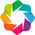

In [31]:
import pandas as pd
import holoviews as hv
from holoviews import opts, dim
from bokeh.sampledata.les_mis import data

hv.extension('bokeh')
hv.output(size=200)

In [84]:
chord = hv.Chord(commute_group.groupby(['대여소그룹','반납소그룹']).count()['대여소번호'].reset_index())
chord.opts(
    opts.Chord(cmap='Category20', edge_cmap='Category20', edge_color=dim('source').str(), 
               labels='name', node_color=dim('index').str()))


:Chord   [대여소그룹,반납소그룹]   (대여소번호)

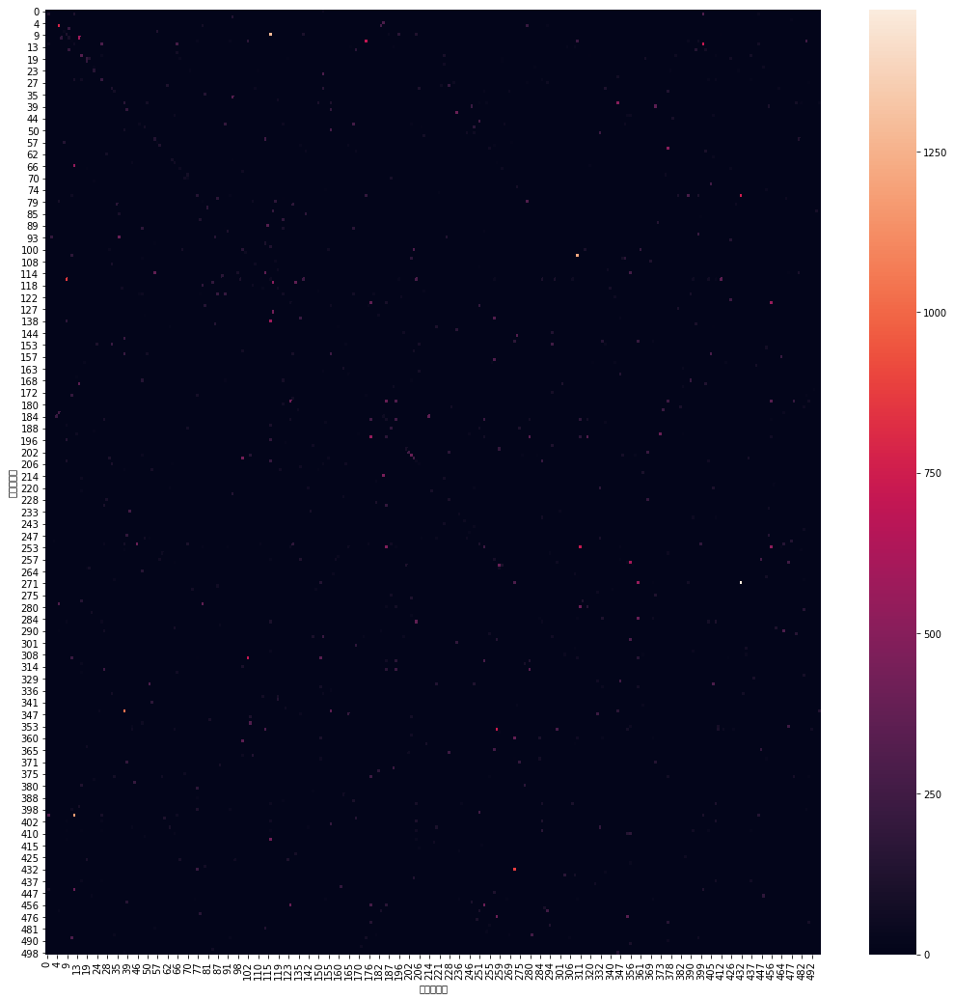

In [86]:
plt.figure(figsize=(18,18))
sns.heatmap(pd.crosstab(commute_group['대여소그룹'], commute_group['반납소그룹'])) # 타지역 이동이 적은 건 당연해서 별로 도움 안되는 차트다

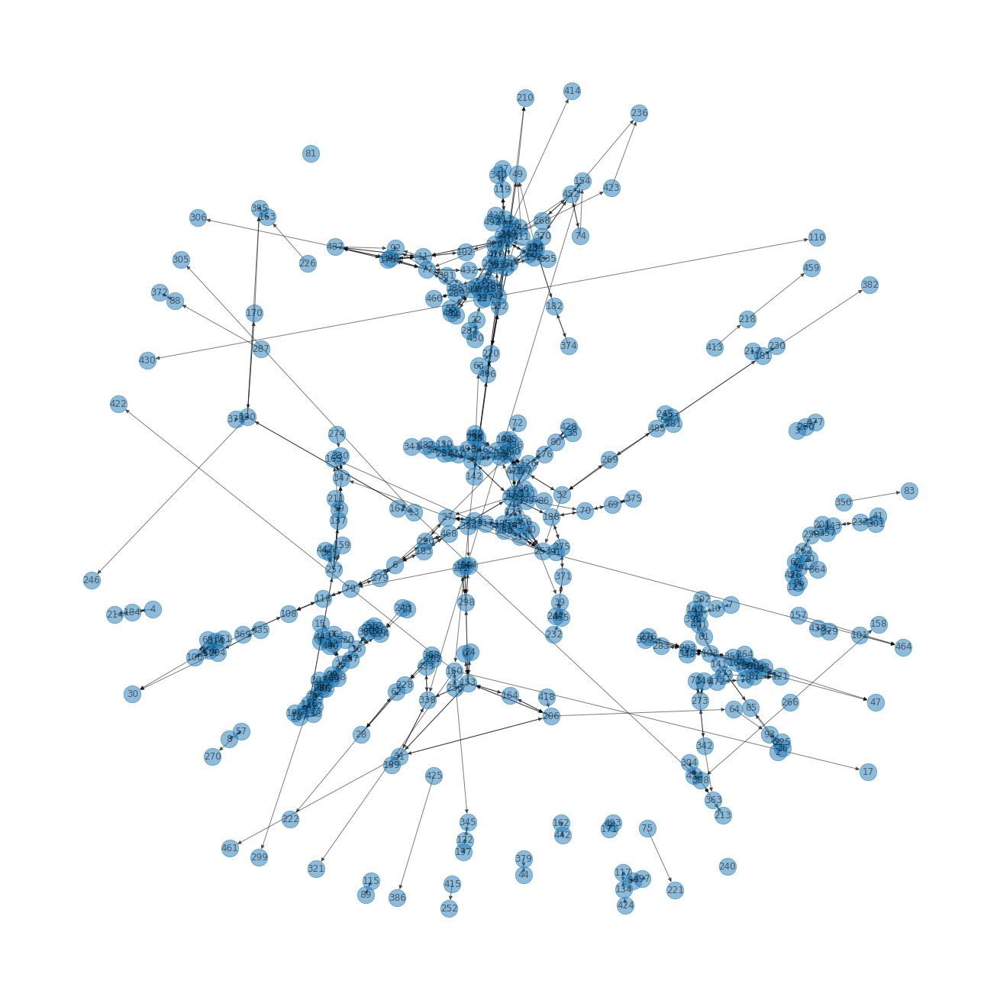

In [88]:
plt.figure(figsize=(18,18))

# Build your graph. Note that we use the DiGraph function to create the graph!
G=nx.from_pandas_edgelist(commute_group, '대여소그룹', '반납소그룹', create_using=nx.DiGraph(), edge_attr=True )
 
# Make the graph
nx.draw(G, with_labels=True, node_size=500, alpha=0.5, arrows=True)

# Commute up groups mainly used

In [91]:
commute_up_group = pd.merge(commute_up, place_group[['대여소번호', 'groups']].rename(columns = {'groups':'대여소그룹'}), 
                      how='inner', on='대여소번호')

In [92]:
commute_up_group = pd.merge(commute_up_group, place_group[['대여소번호', 'groups']].rename(columns = {'groups':'반납소그룹'}), 
                      how='inner', left_on='반납대여소번호', right_on='대여소번호')

In [94]:
commute_up_group = commute_up_group.drop(['자전거번호', '대여소번호_y'], axis=1).rename(columns = {'대여소번호_x':'대여소번호'})
commute_up_group.head()

,대여소번호,반납대여소번호,공유횟수,대여일시,대여대여소명,반납일시,반납대여소명,이용시간,이용거리,대여시간,반납시간,주말,대여소그룹,반납소그룹
0,101,104,343,2018-07-04 08:50:00,(구)합정동 주민센터,2018-07-04 08:55:00,합정역 1번출구 앞,4.0,1010.0,8,8,False,238,392
1,101,104,343,2018-07-11 08:41:00,(구)합정동 주민센터,2018-07-11 08:46:00,합정역 1번출구 앞,5.0,1010.0,8,8,False,238,392
2,101,104,343,2018-07-24 08:37:00,(구)합정동 주민센터,2018-07-24 08:44:00,합정역 1번출구 앞,6.0,1050.0,8,8,False,238,392
3,101,104,343,2018-07-25 08:00:00,(구)합정동 주민센터,2018-07-25 08:08:00,합정역 1번출구 앞,7.0,970.0,8,8,False,238,392
4,101,104,343,2018-07-26 08:05:00,(구)합정동 주민센터,2018-07-26 08:10:00,합정역 1번출구 앞,5.0,750.0,8,8,False,238,392


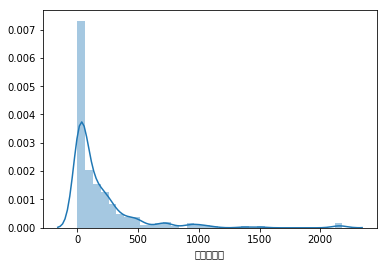

In [97]:
sns.distplot(commute_up_group['반납소그룹'].value_counts())

In [118]:
commute_up20 = commute_up_group.groupby(['대여소그룹', '반납소그룹']).count()['대여소번호'].reset_index().rename(columns={'대여소번호':'횟수'}).nlargest(20,'횟수')
commute_up20.head()

,대여소그룹,반납소그룹,횟수
518,271,432,1396
697,400,12,1109
215,102,310,1060
17,9,116,910
172,77,432,724


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
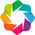

In [31]:
import pandas as pd
import holoviews as hv
from holoviews import opts, dim
from bokeh.sampledata.les_mis import data

hv.extension('bokeh')
hv.output(size=200)

In [158]:
chord = hv.Chord(commute_up20)
chord.opts(
    opts.Chord(cmap='Category20', edge_cmap='Category20', edge_color=dim('대여소그룹').str(), 
               labels='name', node_color=dim('index').str()))


:Chord   [대여소그룹,반납소그룹]   (횟수)

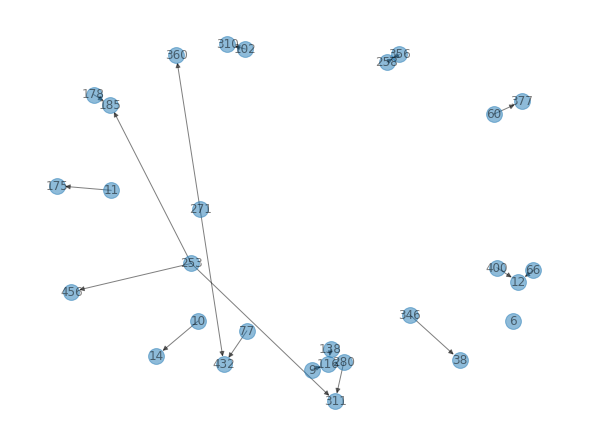

In [169]:
# Build your graph. Note that we use the DiGraph function to create the graph!
G=nx.from_pandas_edgelist(commute_up20, '대여소그룹', '반납소그룹', create_using=nx.DiGraph(), edge_attr=True )
plt.figure(figsize=(8,6))
# Make the graph
nx.draw(G, with_labels=True, node_size=250, alpha=0.5, arrows=True)

# Commute down groups mainly used

In [170]:
commute_down_group = pd.merge(commute_down, place_group[['대여소번호', 'groups']].rename(columns = {'groups':'대여소그룹'}), 
                      how='inner', on='대여소번호')

In [171]:
commute_down_group = pd.merge(commute_down_group, place_group[['대여소번호', 'groups']].rename(columns = {'groups':'반납소그룹'}), 
                      how='inner', left_on='반납대여소번호', right_on='대여소번호')

In [172]:
commute_down_group = commute_down_group.drop(['자전거번호', '대여소번호_y'], axis=1).rename(columns = {'대여소번호_x':'대여소번호'})
commute_down_group.head()

,대여소번호,반납대여소번호,공유횟수,대여일시,대여대여소명,반납일시,반납대여소명,이용시간,이용거리,대여시간,반납시간,주말,대여소그룹,반납소그룹
0,101,104,343,2018-07-27 18:28:00,(구)합정동 주민센터,2018-07-27 18:36:00,합정역 1번출구 앞,7.0,1060.0,18,18,False,238,392
1,101,104,343,2018-07-31 18:00:00,(구)합정동 주민센터,2018-07-31 18:06:00,합정역 1번출구 앞,4.0,1010.0,18,18,False,238,392
2,101,104,343,2018-08-01 18:01:00,(구)합정동 주민센터,2018-08-01 18:09:00,합정역 1번출구 앞,7.0,1010.0,18,18,False,238,392
3,101,104,343,2018-08-08 18:00:00,(구)합정동 주민센터,2018-08-08 18:06:00,합정역 1번출구 앞,5.0,870.0,18,18,False,238,392
4,101,104,343,2018-08-31 18:01:00,(구)합정동 주민센터,2018-08-31 18:09:00,합정역 1번출구 앞,7.0,1060.0,18,18,False,238,392


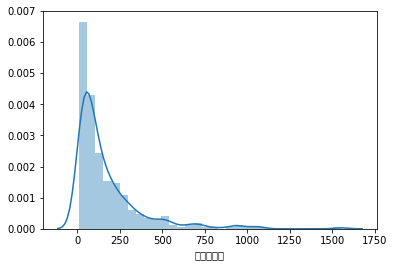

In [173]:
sns.distplot(commute_down_group['반납소그룹'].value_counts())

In [174]:
commute_down20 = commute_down_group.groupby(['대여소그룹', '반납소그룹']).count()['대여소번호'].reset_index().rename(columns={'대여소번호':'횟수'}).nlargest(20,'횟수')
commute_down20.head()

,대여소그룹,반납소그룹,횟수
794,432,271,770
39,12,400,613
255,116,9,565
619,310,102,538
413,191,178,518


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
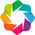

In [31]:
import pandas as pd
import holoviews as hv
from holoviews import opts, dim
from bokeh.sampledata.les_mis import data

hv.extension('bokeh')
hv.output(size=200)

In [186]:
chord = hv.Chord(commute_down20)
chord.opts(
    opts.Chord(cmap='Category20', edge_cmap='Category20', edge_color=dim('대여소그룹').str(), 
               #labels='name', label_text_color='Category20', 
               node_color=dim('index').str()))

:Chord   [대여소그룹,반납소그룹]   (횟수)

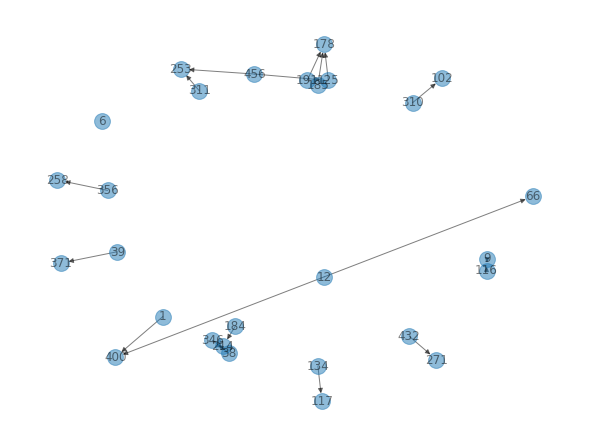

In [176]:
# Build your graph. Note that we use the DiGraph function to create the graph!
G=nx.from_pandas_edgelist(commute_down20, '대여소그룹', '반납소그룹', create_using=nx.DiGraph(), edge_attr=True )
plt.figure(figsize=(8,6))
# Make the graph
nx.draw(G, with_labels=True, node_size=250, alpha=0.5, arrows=True)

In [188]:
commute_up20.to_csv('./data/commute_up20.csv', index=False)

In [189]:
commute_down20.to_csv('./data/commute_down20.csv', index=False)

## On weekend

In [191]:
weekend_group = pd.merge(weekend_leisure, place_group[['대여소번호', 'groups']].rename(columns = {'groups':'대여소그룹'}), 
                      how='inner', on='대여소번호')

In [192]:
weekend_group = pd.merge(weekend_group, place_group[['대여소번호', 'groups']].rename(columns = {'groups':'반납소그룹'}), 
                      how='inner', left_on='반납대여소번호', right_on='대여소번호')

In [193]:
weekend_group = weekend_group.drop(['자전거번호', '대여소번호_y'], axis=1).rename(columns = {'대여소번호_x':'대여소번호'})
weekend_group.head()

,대여소번호,반납대여소번호,공유횟수,대여일시,대여대여소명,반납일시,반납대여소명,이용시간,이용거리,대여시간,반납시간,주말,대여소그룹,반납소그룹
0,101,104,343,2018-07-07 08:41:00,(구)합정동 주민센터,2018-07-07 08:53:00,합정역 1번출구 앞,11.0,1260.0,8,8,True,238,392
1,101,104,343,2018-07-07 08:41:00,(구)합정동 주민센터,2018-07-07 08:53:00,합정역 1번출구 앞,11.0,1330.0,8,8,True,238,392
2,101,104,343,2018-07-07 08:55:00,(구)합정동 주민센터,2018-07-07 09:02:00,합정역 1번출구 앞,6.0,950.0,8,9,True,238,392
3,101,104,343,2018-07-07 15:40:00,(구)합정동 주민센터,2018-07-07 15:48:00,합정역 1번출구 앞,7.0,1010.0,15,15,True,238,392
4,101,104,343,2018-07-07 19:46:00,(구)합정동 주민센터,2018-07-07 19:54:00,합정역 1번출구 앞,7.0,850.0,19,19,True,238,392


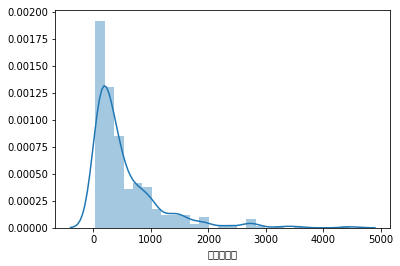

In [194]:
sns.distplot(weekend_group['반납소그룹'].value_counts())

In [196]:
weekend20 = weekend_group.groupby(['대여소그룹', '반납소그룹']).count()['대여소번호'].reset_index().rename(columns={'대여소번호':'횟수'}).nlargest(20,'횟수')
weekend20

,대여소그룹,반납소그룹,횟수
110,38,346,1867
17,9,116,1692
660,346,38,1647
255,116,9,1206
679,356,114,1065
153,60,377,1010
31,11,310,1008
251,114,356,927
50,16,16,923
236,102,310,889


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
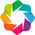

In [197]:
import pandas as pd
import holoviews as hv
from holoviews import opts, dim
from bokeh.sampledata.les_mis import data

hv.extension('bokeh')
hv.output(size=200)

In [198]:
chord = hv.Chord(weekend20)
chord.opts(
    opts.Chord(cmap='Category20', edge_cmap='Category20', edge_color=dim('대여소그룹').str(), 
               labels='name', node_color=dim('index').str()))


ERROR:bokeh.core.validation.check:E-1001 (BAD_COLUMN_NAME): Glyph refers to nonexistent column name. This could either be due to a misspelling or typo, or due to an expected column being missing. : LegendItem(id='7273', ...)


:Chord   [대여소그룹,반납소그룹]   (횟수)

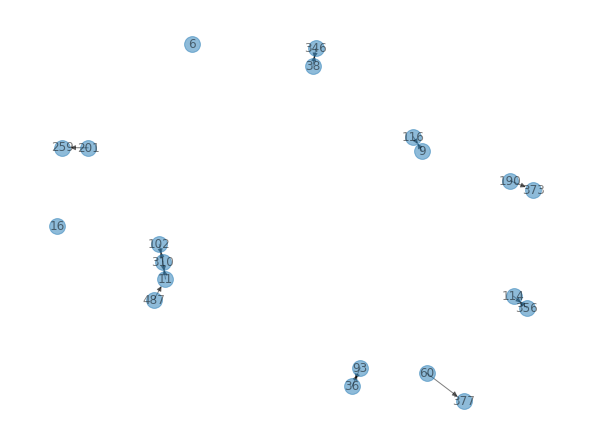

In [199]:
# Build your graph. Note that we use the DiGraph function to create the graph!
G=nx.from_pandas_edgelist(weekend20, '대여소그룹', '반납소그룹', create_using=nx.DiGraph(), edge_attr=True )
plt.figure(figsize=(8,6))
# Make the graph
nx.draw(G, with_labels=True, node_size=250, alpha=0.5, arrows=True)

In [200]:
weekend20.to_csv('./data/weekend20.csv', index=False)